# scRNAsequencing analysis by Seurat library
this script works on R 4.3.2, Seurat 5.0.1
Created by Tatsuya Osaki, 2024/03/27 

## Load Library

In [ ]:
library(Seurat)
library(Matrix)
library(dplyr)
library(patchwork)
library(ggplot2)
library(cowplot)
library(loupeR)
library(SingleR)
library(sctransform)
library(EnhancedVolcano)
library(gridExtra)
library(grid)
library(edgeR)
library(reshape2)
library(S4Vectors)
library(SingleCellExperiment)
library(pheatmap)
library(png)
library(RColorBrewer)
library(limma)
library(magrittr)
library(gridExtra)
library(knitr)
library(limma)
library(remotes)
library("RColorBrewer")
library(scales)
library(escape)
library(dittoSeq)
library("Nebulosa")

Warning message:
"package 'Seurat' was built under R version 4.3.3"
Loading required package: SeuratObject

Warning message:
"package 'SeuratObject' was built under R version 4.3.3"
Loading required package: sp

Warning message:
"package 'sp' was built under R version 4.3.3"

Attaching package: 'SeuratObject'


The following objects are masked from 'package:base':

    intersect, t



Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


Warning message:
"package 'patchwork' was built under R version 4.3.3"
Warning message:
"package 'ggplot2' was built under R version 4.3.3"

Attaching package: 'cowplot'


The following object is masked from 'package:patchwork':

    align_plots


Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats

Warning message:
"package 'matrixSt

In [2]:
custom_colors <- list()

colors_dutch <- c(
    '#FFC312','#C4E538','#12CBC4','#FDA7DF','#ED4C67',
    '#F79F1F','#A3CB38','#1289A7','#D980FA','#B53471',
    '#EE5A24','#009432','#0652DD','#9980FA','#833471',
    '#EA2027','#006266','#1B1464','#5758BB','#6F1E51'
)

colors_spanish <- c(
    '#40407a','#706fd3','#f7f1e3','#34ace0','#33d9b2',
    '#2c2c54','#474787','#aaa69d','#227093','#218c74',
    '#ff5252','#ff793f','#d1ccc0','#ffb142','#ffda79',
    '#b33939','#cd6133','#84817a','#cc8e35','#ccae62'
)

custom_colors$discrete <- c(colors_dutch, colors_spanish)

custom_colors$cell_cycle <- setNames(
    c('#45aaf2', '#f1c40f', '#e74c3c', '#7f8c8d'),
    c('G1',      'S',       'G2M',     '-')
)

## Read seurat object

In [ ]:
#read 10x MN1
R306C <- readRDS("data_Export/R306C_ver1.rds")
V247X <- readRDS("data_Export/V247X_ver1.rds")

# Creat seurat object
R306C_split <- SplitObject(R306C, split.by = "orig.ident")
V247X_split <- SplitObject(V247X, split.by = "orig.ident")

#R306C_split

R306C_S1_S2 <- merge(R306C_split$S1, R306C_split$S2, add.cell.ids = c("S1", "S2"))
V247X_S5_S6 <- merge(V247X_split$S5, V247X_split$S6, add.cell.ids = c("S5", "S6"))
combined.integrated <- merge(R306C_S1_S2, V247X_S5_S6, add.cell.ids = c("R306C", "V247X"))

## Experimental annotation

In [8]:
combined.integrated <- merge(R306C_S1_S2, V247X_S5_S6, add.cell.ids = c("R306C", "V247X"))

## Normalization and find variable features

In [ ]:
combined.integrated.list <- SplitObject(object=combined.integrated,split.by="orig.ident")
for(i in 1:length(combined.integrated.list)){
combined.integrated.list[[i]] <- NormalizeData(combined.integrated.list[[i]],verbose=F) 
combined.integrated.list[[i]] <- FindVariableFeatures(combined.integrated.list[[i]], selection.method="dispersion", nfeatures=5000,verbose=F)
}
combined.integrated <- JoinLayers(combined.integrated)

## Anchoring

In [ ]:
diment=50 
combined.integrated.anchors <- FindIntegrationAnchors(combined.integrated.list, dims=1:diment) # it is for standard CCA with normalizarion and integratoin
combined.integrated <- IntegrateData(anchorset = combined.integrated.anchors,dims=1:diment)


Computing 2000 integration features

Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 29861 anchors

Filtering anchors

	Retained 22865 anchors

Finding neighborhoods

Finding anchors

	Found 18432 anchors

Filtering anchors

	Retained 11814 anchors

Finding neighborhoods

Finding anchors

	Found 18432 anchors

Filtering anchors

	Retained 11814 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 30997 anchors

Filtering anchors

	Retained 23281 anchors

Finding neighborhoods

Finding anchors

	Found 27502 anchors

Filtering anchors

	Retained 4529 anchors

Finding neighborhoods

Finding anchors

	Found 27502 anchors

Filtering anchors

	Retained 4529 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 21937 anchors

Filtering anchors

	Retained 17245 anchors

Finding neighborhoods

Finding anchors

	Found 22438 anchors

Fi

## Data normalizaton, PCA, UMAP

In [13]:
DefaultAssay(object = combined.integrated) <- "integrated"
combined.integrated <- ScaleData(object = combined.integrated, verbose = TRUE)
combined.integrated <- RunPCA(object = combined.integrated, npcs = diment, verbose = TRUE)
combined.integrated <- RunTSNE(object = combined.integrated,  dims = 1:diment, verbose = TRUE)
combined.integrated <- RunUMAP(object = combined.integrated, reduction = "pca",  dims = 1:diment, , see.use=46)

Centering and scaling data matrix

PC_ 1 
Positive:  RPL41, RPLP1, RPL39, RPL13, RPS19, RPS27, EEF1A1, RPS18, RPS24, RPL32 
	   RPS12, RPS28, RPL36, RPS23, RPL29, RPL26, RPS8, RPL17, RPS15A, RPL12 
	   RPS3A, RPL18A, RPL10, RPS2, RPS15, RPL30, RPS14, RPL11, RPL37, FTL 
Negative:  SNHG14, LRRC7, CCSER1, CADM2, NAV3, AUTS2, CTNNA2, NRXN1, FTX, PTPRD 
	   DLGAP1, MYT1L, PPFIA2, MALAT1, LRRTM4, DLG2, ANKS1B, DSCAM, ANK3, TTC28 
	   ADGRB3, FRMD4A, GPHN, CTNND2, SYT1, ANK2, NRXN3, LINC02315, RBFOX1, NBEA 
PC_ 2 
Positive:  MALAT1, AL163872.1, LINC02154, FP671120.4, HMOX1, AC026310.2, AC093866.1, GFAP, AL163541.1, TRIM49B 
	   LCNL1, ATF3, AC025569.1, CRH, AC104002.3, GLT6D1, AC078845.1, CALML3-AS1, BIN2, HKDC1 
	   AL121829.1, LINC02789, SMIM32, AC096759.2, AL357507.1, LINC01090, AC007391.3, TULP2, LINC00520, EPB42 
Negative:  RPS8, RPS3, RPS6, RPS15A, RPS4X, RPS9, RPL10, RPS18, RPL7, RPL23 
	   RPS14, RPL7A, RPL23A, RPS25, RPS5, RPL28, RPL18, RPS2, RPS23, RPLP0 
	   RPL35A, RPL19, RPL10A, 

Read the 56193 x 50 data matrix successfully!
OpenMP is working. 1 threads.
Using no_dims = 2, perplexity = 30.000000, and theta = 0.500000
Computing input similarities...
Building tree...
 - point 10000 of 56193
 - point 20000 of 56193
 - point 30000 of 56193
 - point 40000 of 56193
 - point 50000 of 56193
Done in 733.39 seconds (sparsity = 0.002569)!
Learning embedding...
Iteration 50: error is 115.852956 (50 iterations in 13.13 seconds)
Iteration 100: error is 115.852956 (50 iterations in 14.94 seconds)
Iteration 150: error is 115.842567 (50 iterations in 19.43 seconds)
Iteration 200: error is 112.700918 (50 iterations in 15.98 seconds)
Iteration 250: error is 111.013764 (50 iterations in 13.07 seconds)
Iteration 300: error is 5.290781 (50 iterations in 12.15 seconds)
Iteration 350: error is 4.968040 (50 iterations in 11.77 seconds)
Iteration 400: error is 4.775368 (50 iterations in 11.95 seconds)
Iteration 450: error is 4.635158 (50 iterations in 12.40 seconds)
Iteration 500: error

Warning message:
"The following arguments are not used: see.use"
Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
15:17:16 UMAP embedding parameters a = 0.9922 b = 1.112

15:17:16 Read 56193 rows and found 50 numeric columns

15:17:16 Using Annoy for neighbor search, n_neighbors = 30

15:17:16 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:17:26 Writing NN index file to temp file C:\Users\Tatsuya\AppData\Local\Temp\RtmpOIxuNn\filed03094f4fc2

15:17:26 Searching Annoy index using 1 thread, search_k = 3000

15:17:49 Annoy recall = 100

## Computing nearest neighbor 

In [17]:
DefaultAssay(object = combined.integrated) <- "integrated"
combined.integrated <- FindNeighbors(combined.integrated,dims=1:diment,reduction="pca") 
combined.integrated <- FindClusters(combined.integrated, random.seed=46, resolution = 1.0, algorithm=3)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 56193
Number of edges: 2105734

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.8453
Number of communities: 29
Elapsed time: 54 seconds


2 singletons identified. 27 final clusters.



## Neuronal gene expression

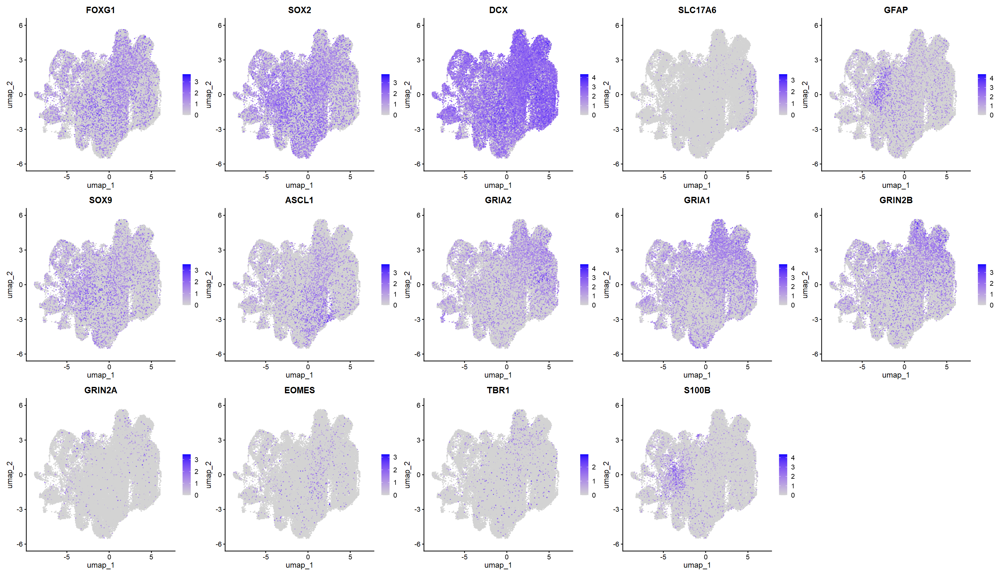

In [29]:
DefaultAssay(combined.integrated) <- "RNA"
options(repr.plot.width=26, repr.plot.height=15)
FeaturePlot(combined.integrated,features = c('FOXG1', 'SOX2', 'DCX', 'SLC17A6',  'GFAP', 'SOX9', 'ASCL1', 'GRIA2', 'GRIA1', 'GRIN2B', 'GRIN2A', 'EOMES', 'TBR1', 'S100B'), cols =c( "lightgrey", "blue"),  ncol=5)

We identified progenitor cells with dorsal (PAX6) or ventral (ASCL1, OLIG2) origins. we identified radial glial cells (RGCs; VIM), cycling RGCs
(ASPM), outer RGCs (oRGCs; HOPX) and intermediate progenitor cells (IPCs; EOMES). These progenitors differentiated into excitatory neu-
rons with specific layer identities, including layer 5/6 neurons (L5/6; BCL11B), L6 cortical thalamic projection neurons (FOXP2, TLE4) 25, L4
neurons (RORB, UNC5D, NR2F1) 26,27 and L2/3 neurons (SATB2).  Ventral radial glial cells (v-RGCs; cell cycling ventral RGCs, ccv-RGCs) differen -
tiated into interneuron precursor cells (INPs; DLX2), which generated interneurons with lateral ganglionic eminence (LGE) origin (LGE-IN;
MEIS2) or caudal ganglionic eminence (CGE) origin (CGE-IN; NR2F2)28 
Notably, we found a cluster of interneurons expressing MEIS2 and high levels of PAX6 (LGE PAX6 + interneurons), a signature that resembles
mouse olfactory bulb precursors that were recently reported to gen-erate neurons redirected to white matter in primates 29
. In addition to neuronal populations, we identified glial cell populations including astrocytes (S100B, APOE, ALDH1L1) and OPCs (OLIG2, PDGFRA)


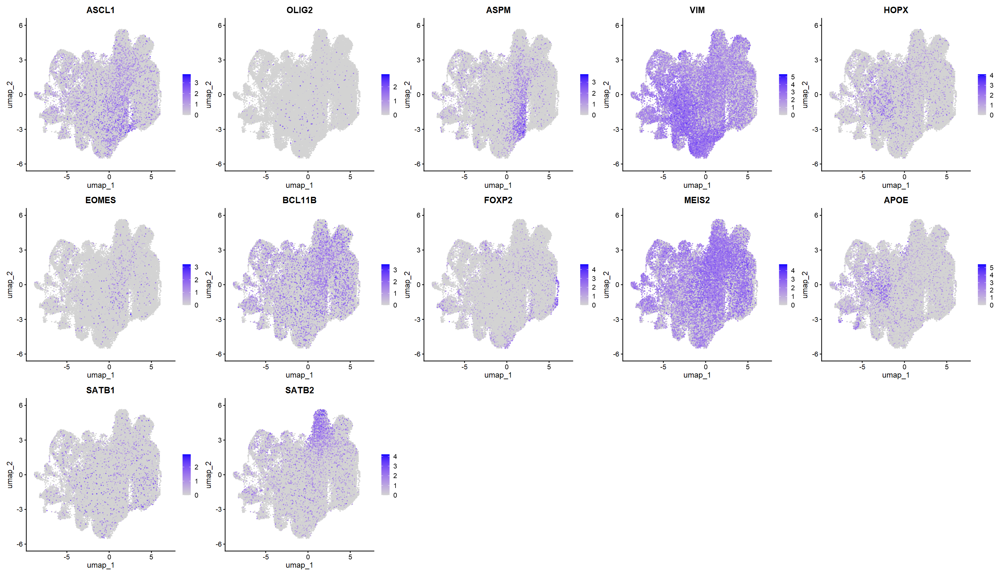

In [30]:
options(repr.plot.width=26, repr.plot.height=15)
FeaturePlot(combined.integrated, features = c('ASCL1', 'OLIG2', 'ASPM', 'VIM',  'HOPX', 'EOMES', 'BCL11B', 'FOXP2', 'MEIS2', 'APOE', 'SATB1','SATB2'), cols =c(  "lightgrey","blue"),  ncol=5)


## figure

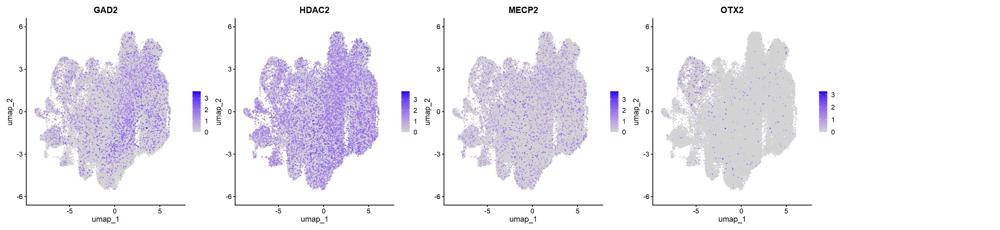

In [35]:
options(repr.plot.width=26, repr.plot.height=6)
DefaultAssay(combined.integrated) <- "RNA"
FeaturePlot(combined.integrated, min.cutoff =0, features = c("GAD2", 'HDAC2', 'MECP2', 'OTX2'), cols =c("lightgrey", "blue"), pt.size=.1, ncol=5)

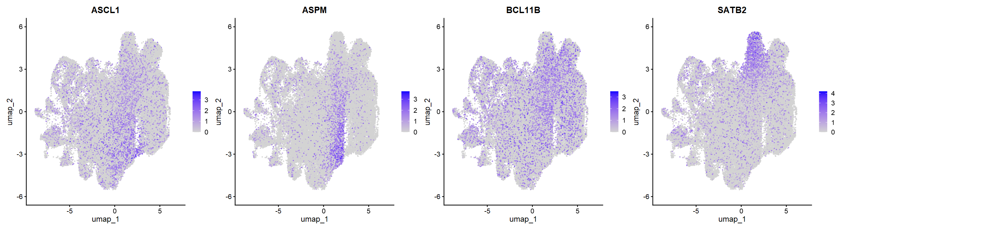

In [36]:
options(repr.plot.width=26, repr.plot.height=6)
DefaultAssay(combined.integrated) <- "RNA"
FeaturePlot(combined.integrated, min.cutoff =0, features = c("ASCL1", 'ASPM', 'BCL11B', 'SATB2'), cols =c("lightgrey", "blue"), pt.size=.1, ncol=5)

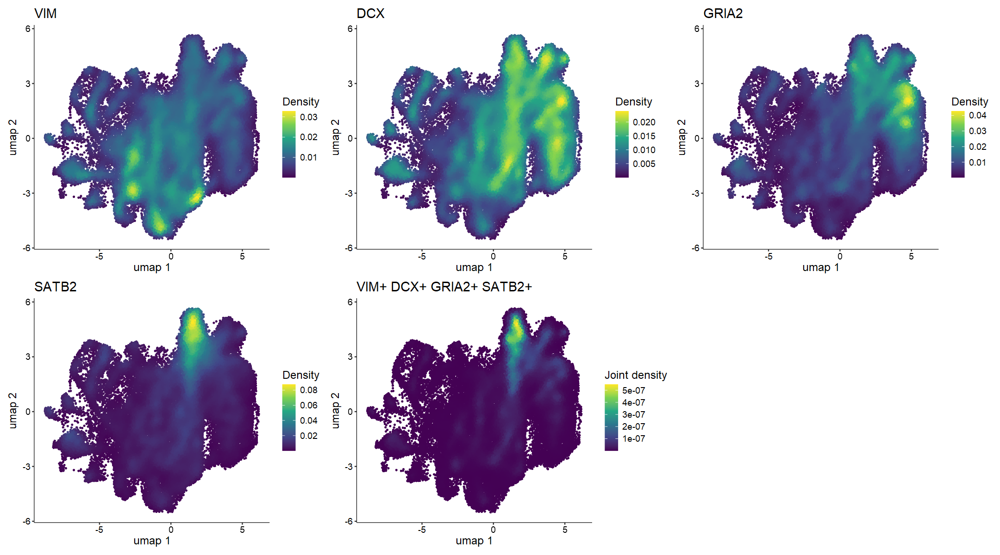

In [47]:
options(repr.plot.width=18, repr.plot.height=10)
DefaultAssay(combined.integrated) <- "RNA"
plot_density(combined.integrated, reduction='umap', c("VIM", "DCX", "GRIA2", "SATB2"), method= "ks", pal = "viridis", joint = TRUE)

## Build cluster tree & feature extraction

In [ ]:
DefaultAssay(combined.integrated) <- "integrated"
combined.integrated <- BuildClusterTree(combined.integrated)
all_markers <- FindAllMarkers(combined.integrated, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
toprankinggene <- all_markers %>% group_by(cluster) %>% top_n(n = 100, wt = avg_log2FC)
all_markers %>% group_by(cluster)

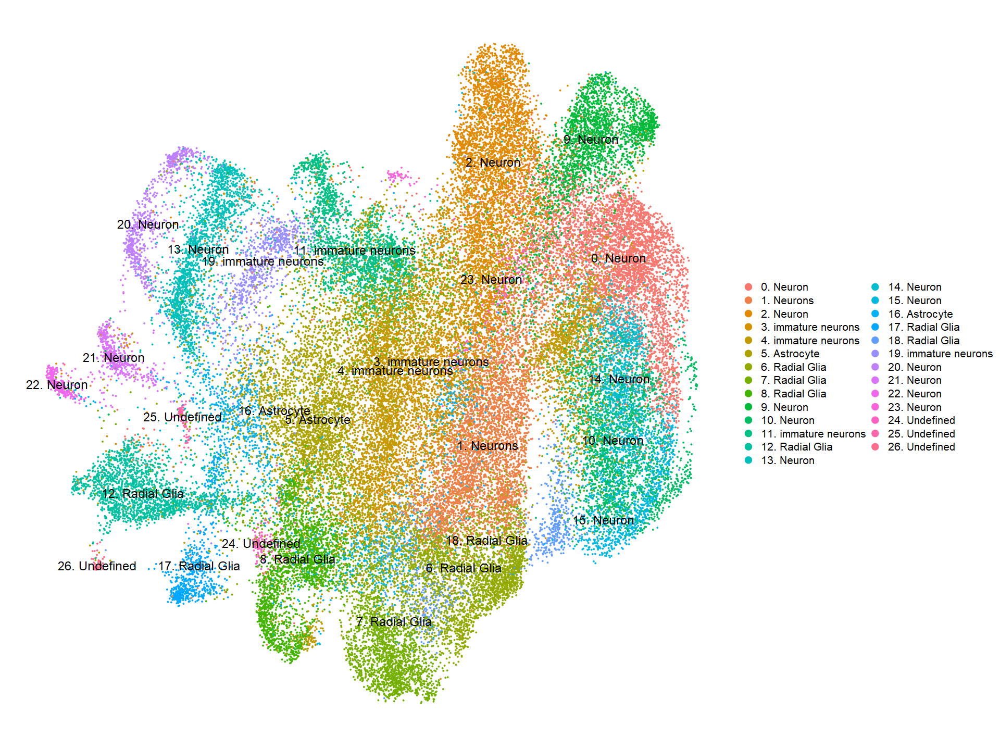

In [ ]:
new.cluster.ids <- c(
                    "0. Neuron", 
                    "1. Neurons",
                    "2. Neuron", 
                    "3. immature neurons",
                    "4. immature neurons", 
                    "5. Astrocyte",
                    "6. Radial Glia", 
                    "7. Radial Glia", 
                    "8. Radial Glia",
                    "9. Neuron",
                    "10. Neuron",
                    "11. immature neurons", 
                    "12. Radial Glia",
                    "13. Neuron", 
                    "14. Neuron",
                    "15. Neuron",
                    "16. Astrocyte",
                    "17. Radial Glia" ,
                    "18. Radial Glia",
                    "19. immature neurons",
                    "20. Neuron",
                    "21. Neuron", 
                    "22. Neuron",
                    "23. Neuron",
                    "24. Undefined",
                    "25. Undefined",
                    "26. Undefined"
                    )
names(new.cluster.ids) <- levels(combined.integrated)
combined.integrated <- RenameIdents(combined.integrated, new.cluster.ids)
combined.integrated[["cluster.ident"]] <- Idents(combined.integrated)

options(repr.plot.width=16, repr.plot.height=12)
gg1<-DimPlot(combined.integrated, reduction = "umap", label = TRUE, label.size = 5 )+ NoAxes()#+NoLegend()
gg1

[1] "Neuron"           "immature neurons" "Astrocyte"        "Radial Glia"     
[5] "Undefined"

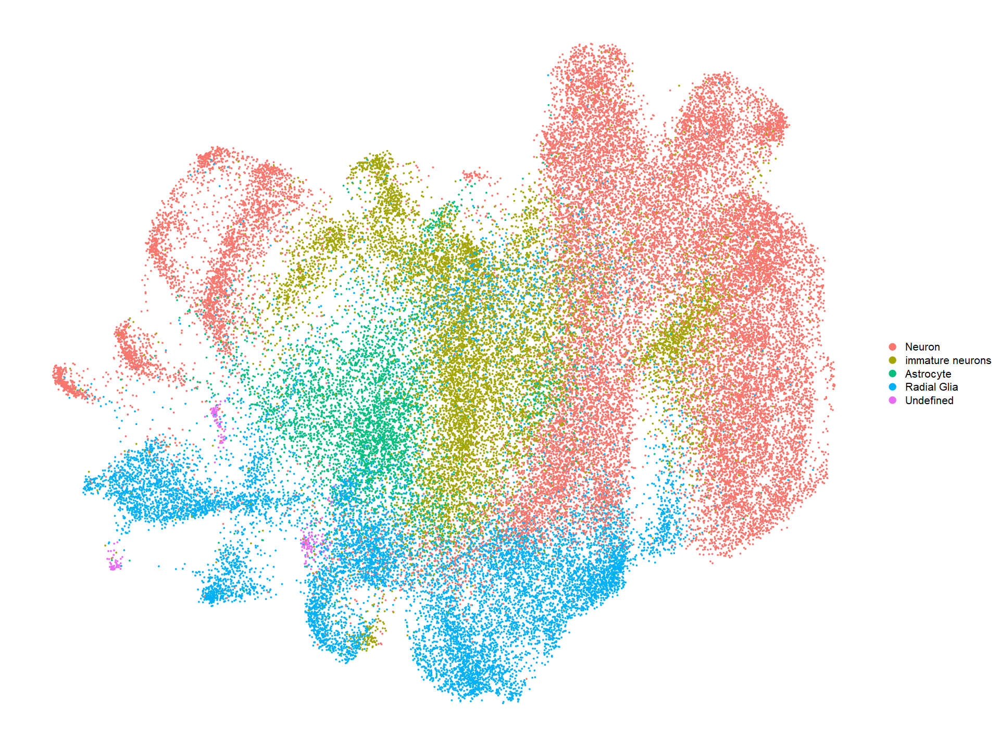

In [ ]:
Idents(combined.integrated) <- "cluster.ident"
celltype.ids <- c(
                    "Neuron", 
                    "Neuron",
                    "Neuron", 
                    "immature neurons",
                    "immature neurons", 
                    "Astrocyte",
                    "Radial Glia", 
                    "Radial Glia", 
                    "Radial Glia",
                    "Neuron",
                    "Neuron",
                    "immature neurons", 
                    "Radial Glia",
                    "Neuron", 
                    "Neuron",
                    "Neuron",
                    "Astrocyte",
                    "Radial Glia" ,
                    "Radial Glia",
                    "immature neurons",
                    "Neuron",
                    "Neuron", 
                    "Neuron",
                    "Neuron",
                    "Undefined",
                    "Undefined",
                    "Undefined"
                    )
names(celltype.ids) <- levels(combined.integrated)
combined.integrated <- RenameIdents(combined.integrated, celltype.ids)

options(repr.plot.width=16, repr.plot.height=12)
gg1<-DimPlot(combined.integrated, reduction = "umap", label = FALSE, label.size = 5 )+ NoAxes()#+NoLegend()
combined.integrated[["cell_type.ident"]] <- Idents(combined.integrated)
gg1

levels(combined.integrated)

[1] "Exitatory neurons"          "Inhibitory neurons"        
 [3] "SATB2 neurons"              "oRGCs"                     
 [5] "Astrocyte"                  "Ventral progenitor neurons"
 [7] "Ventral oRGCs"              "NPCs"                      
 [9] "cRGCs"                      "Undefined"                 
[11] "OTX2 neurons"

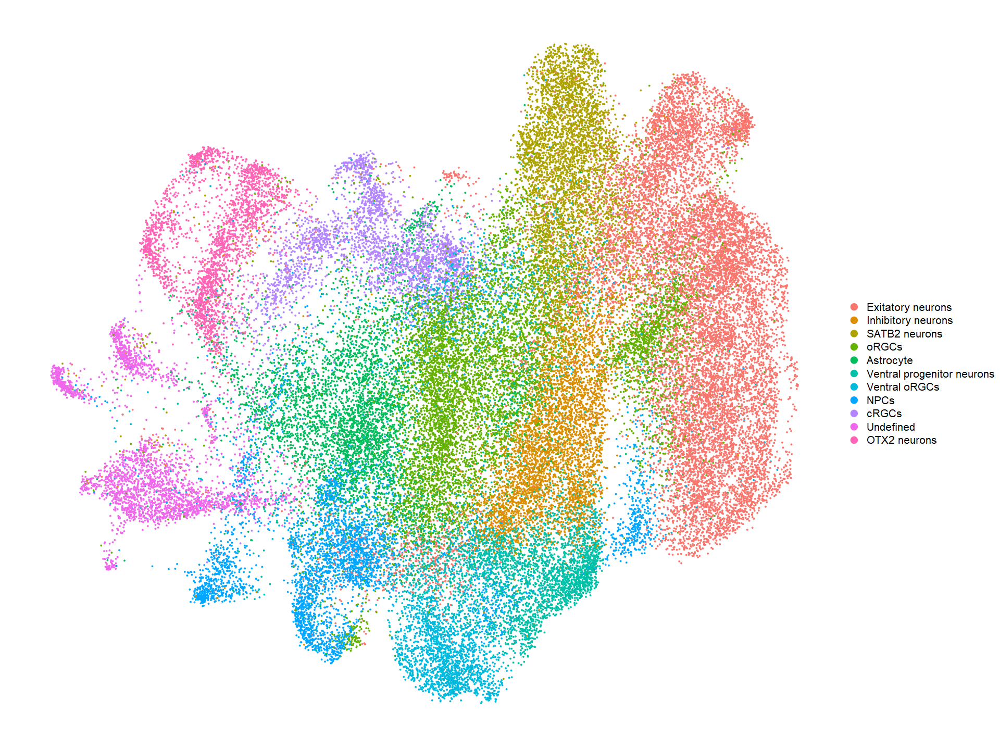

In [ ]:
Idents(combined.integrated) <- "integrated_snn_res.1"

deep_celltype.ids <- c(
                    "Exitatory neurons", 
                    "Inhibitory neurons",
                    "SATB2 neurons", 
                    "oRGCs",
                    "oRGCs", 
                    "Astrocyte",
                    "Ventral progenitor neurons", 
                    "Ventral oRGCs", 
                    "NPCs",
                    "Exitatory neurons",
                    "Exitatory neurons",
                    "cRGCs", 
                    "Undefined",
                    "OTX2 neurons", 
                    "Exitatory neurons",
                    "Exitatory neurons",
                    "Astrocyte",
                    "NPCs" ,
                    "NPCs",
                    "cRGCs",
                    "OTX2 neurons",
                    "Undefined", 
                    "Undefined",
                    "Exitatory neurons",
                    "NPCs",
                    "Undefined",
                    "Undefined"
                    )
names(deep_celltype.ids) <- levels(combined.integrated)
combined.integrated <- RenameIdents(combined.integrated, deep_celltype.ids)

options(repr.plot.width=16, repr.plot.height=12)
gg1<-DimPlot(combined.integrated, reduction = "umap", label = FALSE, label.size = 5 )+ NoAxes()#+NoLegend()
combined.integrated[["deep_cell_type.ident"]] <- Idents(combined.integrated)
gg1

levels(combined.integrated)


Idents(combined.integrated) <- "cell_type.ident"
#Idents(combined.integrated) <- "cluster.ident"
combined.integrated@meta.data
table(Idents(combined.integrated))

In [69]:
#Idents(combined.integrated)
table(Idents(combined.integrated))


          Neuron immature neurons        Astrocyte      Radial Glia 
           26654            11391             4679            13213 
       Undefined 
             256 

## TOP rank genes across clusters

In [70]:
DefaultAssay(combined.integrated) <- "RNA"
top20 <- all_markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_log2FC)
top10 <- all_markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)
top5 <- all_markers %>% group_by(cluster) %>% top_n(n = 5, wt = avg_log2FC)

top3 <- all_markers %>% group_by(cluster) %>% top_n(n = 3, wt = avg_log2FC)
top2 <- all_markers %>% group_by(cluster) %>% top_n(n = 2, wt = avg_log2FC)
top1 <- all_markers %>% group_by(cluster) %>% top_n(n = 1, wt = avg_log2FC)

In [98]:
library(Signac)
library(SeuratWrappers)
library(monocle3)
library(tidyverse)

Warning message:
"package 'Signac' was built under R version 4.3.3"

Attaching package: 'monocle3'


The following objects are masked from 'package:Biobase':

    exprs, fData, fData<-, pData, pData<-


Warning message:
"package 'lubridate' was built under R version 4.3.3"
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ lubridate 1.9.4     ✔ tibble    3.2.1
✔ purrr     1.0.2     ✔ tidyr     1.3.1
✔ readr     2.1.5     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ lubridate::%within%()    masks IRanges::%within%()
✖ readr::col_factor()      masks scales::col_factor()
✖ IRanges::collapse()      masks dplyr::collapse()
✖ gridExtra::combine()     masks Biobase::combine(), BiocGenerics::combine(), dplyr::combine()
✖ matrixStats::count()     masks dplyr::count()
✖ IRanges::desc()          masks dplyr::desc()
✖ purrr::discard()         masks scales::discard()
✖ tidyr::expand()     

In [99]:
num.labels <- length(new.cluster.ids)
names(new.cluster.ids) <- paste0( rep("Cluster", num.labels), seq(num.labels) )
new.cluster.ids

Cluster1               Cluster2               Cluster3 
           "0. Neuron"           "1. Neurons"            "2. Neuron" 
              Cluster4               Cluster5               Cluster6 
 "3. immature neurons"  "4. immature neurons"         "5. Astrocyte" 
              Cluster7               Cluster8               Cluster9 
      "6. Radial Glia"       "7. Radial Glia"       "8. Radial Glia" 
             Cluster10              Cluster11              Cluster12 
           "9. Neuron"           "10. Neuron" "11. immature neurons" 
             Cluster13              Cluster14              Cluster15 
     "12. Radial Glia"           "13. Neuron"           "14. Neuron" 
             Cluster16              Cluster17              Cluster18 
          "15. Neuron"        "16. Astrocyte"      "17. Radial Glia" 
             Cluster19              Cluster20              Cluster21 
     "18. Radial Glia" "19. immature neurons"           "20. Neuron" 
             Cluster22              Cluster23              Cluster24 
          "21. Neuron"           "22. Neuron"           "23. Neuron" 
             Cluster25              Cluster26              Cluster27 
       "24. Undefined"        "25. Undefined"        "26. Undefined"

In [100]:
cds <- as.cell_data_set(combined.integrated)
cds <- cluster_cells(cds = cds, reduction_method = "UMAP")

head(colData(cds))
fData(cds)
rownames(fData(cds))[1:10]
fData(cds)$gene_short_name <- rownames(fData(cds))
head(fData(cds))

recreate.partitions <- c(rep(1, length(cds@colData@rownames)))
names(recreate.partitions) <- cds@colData@rownames
recreate.partitions <- as.factor(recreate.partitions)
#recreate.partitions

cds@clusters@listData[["UMAP"]][["partitions"]] <- recreate.partitions

list.combined.integrated <-combined.integrated@active.ident
cds@clusters@listData[["UMAP"]][["clusters"]] <- list.combined.integrated
cds@int_colData@listData[["reducedDims"]]@listData[["UMAP"]] <- combined.integrated@reductions$umap@cell.embeddings

options(repr.plot.width=6, repr.plot.height=6)

cluster.before.traj <-plot_cells(cds, color_cells_by = "cluster", label_groups_by_cluster = F, 
        group_label_size = 5) + theme(legend.position = "right")

cluster.before.traj
cds <- learn_graph(cds, use_partition = F)
cds <- order_cells(cds,reduction_method = "UMAP",  root_cells = colnames(cds[,clusters(cds) == 6]))


ERROR: [1m[33mError[39m in `GetAssayData()`:[22m
[33m![39m GetAssayData doesn't work for multiple layers in v5 assay.


## Hallmark analysis with Cluster profiler

In [ ]:
library ("org.Hs.eg.db")
library(msigdbr)
library(clusterProfiler)
library(EnsDb.Hsapiens.v79)

hallmark_gene <- read.gmt("h.all.v2023.2.Hs.symbols.gmt")
gene.sets_c5 <- read.gmt("c5.all.v2023.2.Hs.symbols.gmt")
gene.sets_c6 <- read.gmt("c6.all.v2023.2.Hs.symbols.gmt")
gene.sets_c4 <- read.gmt("c4.all.v2023.2.Hs.symbols.gmt")
gene.sets_go_all <- read.gmt("c5.go.v2023.2.Hs.symbols.gmt")
gene.sets_go_cc <- read.gmt("c5.go.cc.v2023.2.Hs.symbols.gmt")
gene.sets_go_bp <- read.gmt("c5.go.bp.v2023.2.Hs.symbols.gmt")
gene.sets_go_mf <- read.gmt("c5.go.mf.v2023.2.Hs.symbols.gmt")


In [ ]:
hallmark<- function (DEG_result, gene_set){
    all.genes <- rownames(DEG_result)

    up_regulation.genes <- all.genes[DEG_result$p_val_adj < 0.05]
    down_regulation.genes <- all.genes[DEG_result$p_val_adj < 0.05]

    all.genes.entrez <- ensembldb::select(EnsDb.Hsapiens.v79, keys= all.genes , keytype = "SYMBOL", columns = "ENTREZID")
    up_regulation.genes.entrez <- ensembldb::select(EnsDb.Hsapiens.v79, keys= up_regulation.genes  , keytype = "SYMBOL", columns = "ENTREZID")
    down_regulation.genes.entrez <- ensembldb::select(EnsDb.Hsapiens.v79, keys= down_regulation.genes, keytype = "SYMBOL", columns = "ENTREZID")

    em_up <- enricher(up_regulation.genes.entrez$SYMBOL, TERM2GENE=gene_set, pAdjustMethod = "BH",minGSSize =1)
    em_down <- enricher(down_regulation.genes.entrez$SYMBOL, TERM2GENE=gene_set, pAdjustMethod = "BH",)

    #head(em)

    #CP_barplot_up <-barplot(em_up, drop=FALSE, showCategory=30)
    CP_dotplot_up<-clusterProfiler::dotplot(em_up,   showCategory=20, title = "Up_regulation")


    #CP_barplot_down <-barplot(em_down, drop=FALSE, showCategory=30)
    CP_dotplot_down<-clusterProfiler::dotplot(em_down,   showCategory=20, title = "down_regulation",)

    #pdf(file="../Result_dir/6_vs_4_3month/GO_enrichiment_analysis_CP.png")
    options(repr.plot.width=12, repr.plot.height=6)
    CP_dotplot_up
    #g1<-grid.arrange(CP_dotplot_up, CP_dotplot_down, ncol = 2, nrow = 1, top = textGrob("Hallmark analysis", gp = gpar(fontsize = 20)))
    #g2<-grid.arrange(CP_barplot_down, CP_dotplot_down, ncol = 2, nrow = 1, top = textGrob("GO enrichment analysis, down-regulation pathway", gp = gpar(fontsize = 20)))
    #dev.off()

}

In [ ]:
enrichment_barplot<- function (DEG_result, gene_set){
    all.genes <- rownames(DEG_result)

    up_regulation.genes <- all.genes[(DEG_result$p_val_adj < 0.1 & DEG_result$avg_log2FC > 1.2)]
    down_regulation.genes <- all.genes[(DEG_result$p_val_adj < 0.1 & DEG_result$avg_log2FC < 1.2)]

    all.genes.entrez <- ensembldb::select(EnsDb.Hsapiens.v79, keys= all.genes , keytype = "SYMBOL", columns = "ENTREZID")
    up_regulation.genes.entrez <- ensembldb::select(EnsDb.Hsapiens.v79, keys= up_regulation.genes  , keytype = "SYMBOL", columns = "ENTREZID")
    down_regulation.genes.entrez <- ensembldb::select(EnsDb.Hsapiens.v79, keys= down_regulation.genes, keytype = "SYMBOL", columns = "ENTREZID")

    em_up <- enricher(up_regulation.genes.entrez$SYMBOL, TERM2GENE=gene_set, pAdjustMethod = "BH",minGSSize =1)
    em_down <- enricher(down_regulation.genes.entrez$SYMBOL, TERM2GENE=gene_set, pAdjustMethod = "BH",)

    #head(em)

    CP_barplot_up <-barplot(em_up, drop=TRUE, showCategory=30) + labs (title = "Up regulaltion")
    #CP_dotplot_up<-clusterProfiler::dotplot(em_up,   showCategory=20, title = "Up_regulation")


    CP_barplot_down <-barplot(em_down, drop=TRUE, showCategory=30) + labs (title = "Down regulation ")
    #CP_dotplot_down<-clusterProfiler::dotplot(em_down,   showCategory=20, title = "down_regulation",)

    #pdf(file="../Result_dir/6_vs_4_3month/GO_enrichiment_analysis_CP.png")
    options(repr.plot.width=12, repr.plot.height=3)
    # CP_barplot_up
    # CP_barplot_down
    #g1<-grid.arrange(CP_dotplot_up, CP_dotplot_down, ncol = 2, nrow = 1, top = textGrob("Hallmark analysis", gp = gpar(fontsize = 20)))
    g2<-grid.arrange(CP_barplot_up, CP_barplot_down, ncol = 2, nrow = 1, top = textGrob("GO enrichment analysis", gp = gpar(fontsize = 20)))
    g2
    #dev.off()

}
enrichment_barplot(DEG_orig, hallmark_gene)

## ssGSEA analysis with escape

In [ ]:
hallmark_gene <- read.gmt("h.all.v2023.2.Hs.symbols.gmt")

data("escape.gene.sets", package="escape")
gene.sets2 <- escape.gene.sets
gene.sets3 <- getGeneSets(library = "H")

ES.seurat1 <- enrichIt(obj = combined.integrated@assays$RNA$counts, gene.sets = gene.sets3, cores = 2, min.size = 1, ssGSEA.norm = TRUE)


In [ ]:
combined.integrated <- AddMetaData(combined.integrated, metadata = ES.seurat1)
options(repr.plot.width=12, repr.plot.height=6)
colors <- colorRampPalette(c("blue4","blue1","white","red1","red4"))

dittoHeatmap(combined.integrated, genes = NULL, metas = names(ES.seurat1), 
            annot.by = c("orig.ident"), 
            fontsize = 7, 
            cluster_cols = FALSE,
            heatmap.colors = colors(50))

options(repr.plot.width=12, repr.plot.height=5)

g1<-dittoHeatmap(combined.integrated, 
            genes = NULL, 
            metas= c(  "HALLMARK_IL2_STAT5_SIGNALING", 
                        "HALLMARK_IL6_JAK_STAT3_SIGNALING", 
                        "HALLMARK_INFLAMMATORY_RESPONSE"), 
            annot.by = c("orig.ident", "deep_cell_type.ident"),
            fontsize = 7, 
            cluster_cols = FALSE,
            heatmap.colors = colors(50))
g1

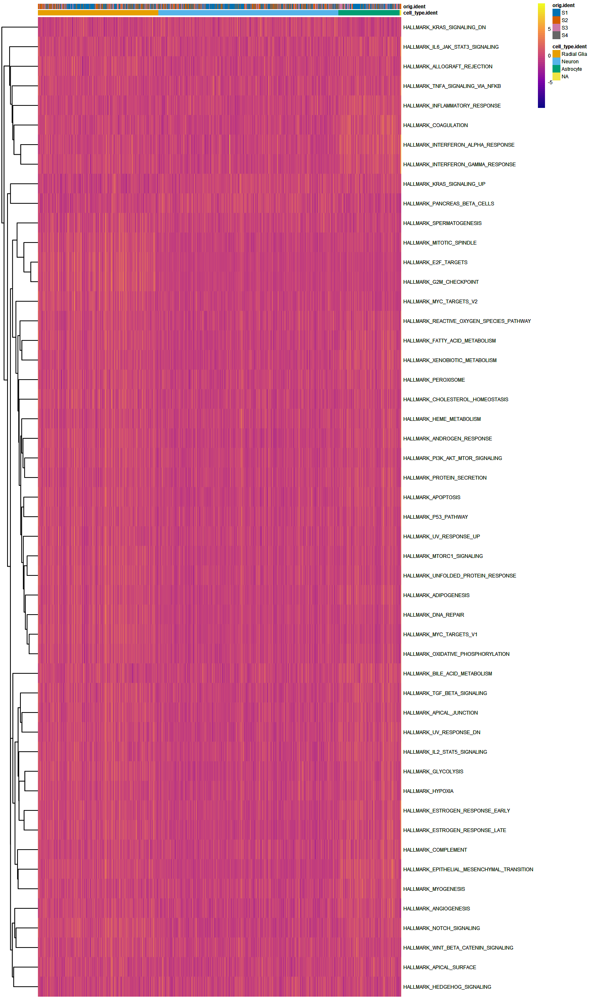

In [ ]:
colors <- colorRampPalette(c("#0D0887FF","#7E03A8FF","#CC4678FF","#F89441FF","#F0F921FF"))
options(repr.plot.width=12, repr.plot.height=20)

dittoHeatmap(combined.integrated, genes = NULL, metas = names(ES.seurat1), 
            annot.by = c("cell_type.ident", "orig.ident"), 
            fontsize = 7, 
            cluster_cols = FALSE,
            heatmap.colors = colors(50))

## Export for CellChatDB and NeuronChatDB


In [ ]:

saveRDS(combined.integrated, "data_export/myDataset_ver1.rds")
# saveRDS(EC_cluster, "data_export/ECdata.rds")
# saveRDS(NK_cluster, "data_export/NKdata.rds")